Library

In [1]:
import tensorflow as tf
import pandas as pd
import numpy as np
# import tensorflow_datasets as tfds
import os
import zipfile
import shutil
import random
import matplotlib.pyplot as plt 
import matplotlib.image as mpimg
from shutil import copyfile
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img
from tensorflow.keras.preprocessing import image_dataset_from_directory

Load Data

In [4]:

local_zip='./archive.zip'
zip_ref   = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('./')

zip_ref.close()

In [38]:

# try:
#     os.rename('train', 'vegetables')
# except:
#     directory = "vegetables"
    
#     # Parent Directory 
#     parent = "./"
    
#     # Path 
#     path = os.path.join(parent, directory) 
#     shutil.rmtree(path)
#     os.rename('train', 'vegetables')

Data Exploration

In [2]:
directory1=os.listdir('./')
print(directory1)

['Accuracy_v1_InceptionV3.png', 'archive.zip', 'Loss_v1_InceptionV3.png', 'model.tflite', 'SaveModel1', 'Tomato.ipynb', 'Tomato_Leaf_Deseases']


In [7]:
try:
    os.rename('Tomato Leaf Diseases', 'Tomato_Leaf_Deseases')
except:
    directory = "Tomato_Leaf_Deseases"
    
    # Parent Directory 
    parent = "./"
    
    # Path 
    path = os.path.join(parent, directory) 
    shutil.rmtree(path)
    os.rename('Tomato Leaf Diseases', 'Tomato_Leaf_Deseases')

In [3]:
directory1=os.listdir('./Tomato_Leaf_Deseases')
print(directory1)

['Split_dtVal', 'Training Set', 'Validation Set']


In [4]:
list_train_dir = os.listdir('./Tomato_Leaf_Deseases/Training Set/')
print(list_train_dir)
print(len(list_train_dir))


['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']
10


In [5]:
image_directory='./Tomato_Leaf_Deseases/Training Set/'

for  item in list_train_dir:
  class_dir = os.path.join(image_directory,item)
  print(item ," : ",len(os.listdir(class_dir)),"images")

Tomato___Bacterial_spot  :  1000 images
Tomato___Early_blight  :  1000 images
Tomato___healthy  :  1000 images
Tomato___Late_blight  :  1000 images
Tomato___Leaf_Mold  :  1000 images
Tomato___Septoria_leaf_spot  :  1000 images
Tomato___Spider_mites Two-spotted_spider_mite  :  1000 images
Tomato___Target_Spot  :  1000 images
Tomato___Tomato_mosaic_virus  :  1000 images
Tomato___Tomato_Yellow_Leaf_Curl_Virus  :  1000 images


Tomato___Bacterial_spot


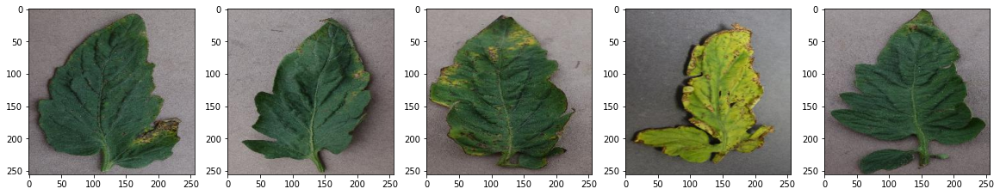

Tomato___Early_blight


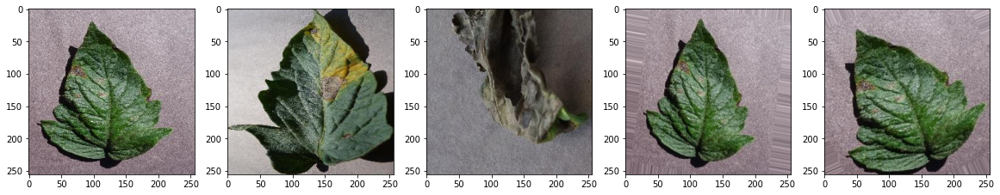

Tomato___healthy


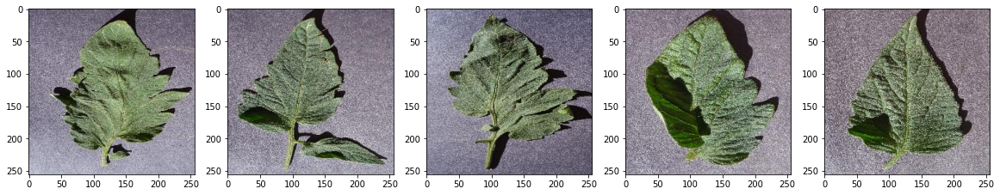

Tomato___Late_blight


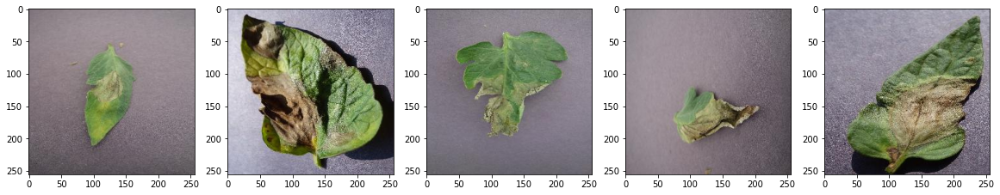

Tomato___Leaf_Mold


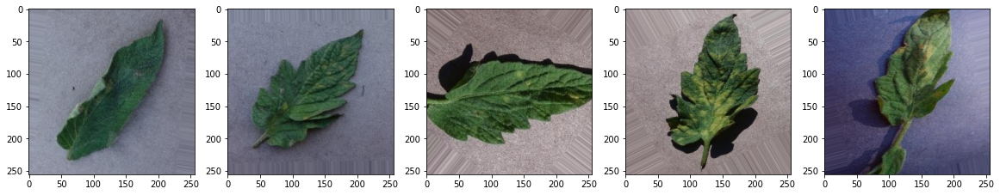

Tomato___Septoria_leaf_spot


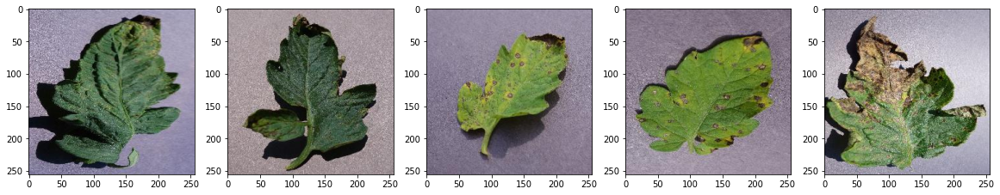

Tomato___Spider_mites Two-spotted_spider_mite


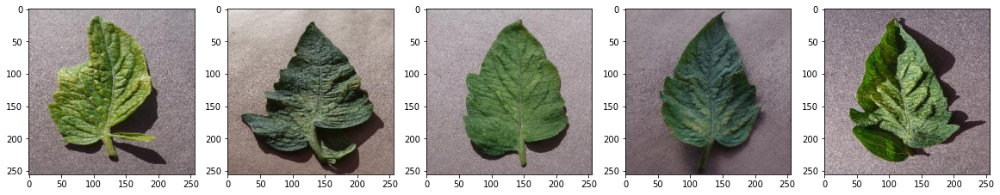

Tomato___Target_Spot


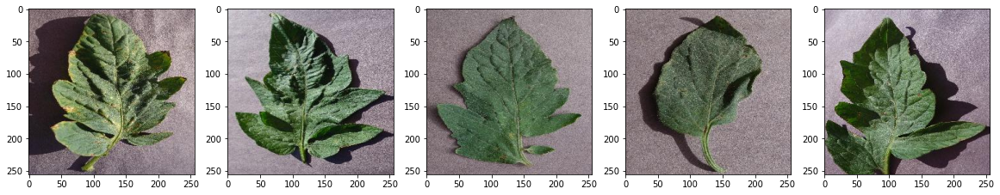

Tomato___Tomato_mosaic_virus


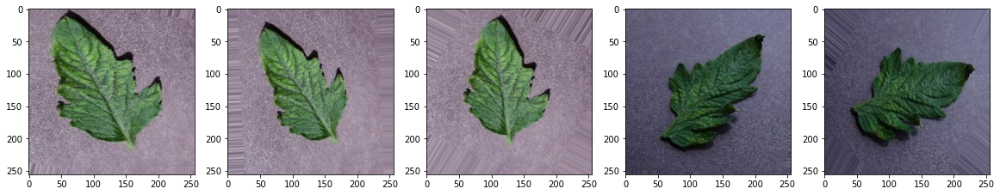

Tomato___Tomato_Yellow_Leaf_Curl_Virus


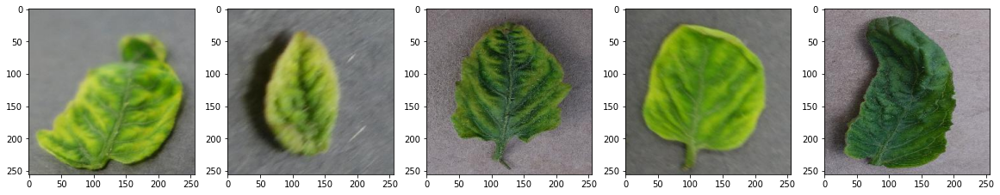

In [17]:
#checking image on directory
for  images in list_train_dir:
  print(images)
  class_dir = os.path.join(image_directory,images)
  class_images = os.listdir(class_dir)
  plt.figure(figsize=(20, 4))
  for i, img_path in enumerate(class_images[:5]):
    sp = plt.subplot(1, 5, i+1)
    img = mpimg.imread(os.path.join(class_dir, img_path))
    plt.imshow(img)
  plt.show()

In [6]:
list_val_dir = os.listdir('./Tomato_Leaf_Deseases/Validation Set/')
print(list_val_dir)

['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus']


In [7]:
image_directory='./Tomato_Leaf_Deseases/Validation Set/'

for  item in list_val_dir:
  class_dir = os.path.join(image_directory,item)
  print(item ," : ",len(os.listdir(class_dir)),"images")


Tomato___Bacterial_spot  :  700 images
Tomato___Early_blight  :  700 images
Tomato___healthy  :  700 images
Tomato___Late_blight  :  700 images
Tomato___Leaf_Mold  :  700 images
Tomato___Septoria_leaf_spot  :  700 images
Tomato___Spider_mites Two-spotted_spider_mite  :  700 images
Tomato___Target_Spot  :  700 images
Tomato___Tomato_mosaic_virus  :  700 images
Tomato___Tomato_Yellow_Leaf_Curl_Virus  :  700 images


Tomato___Bacterial_spot


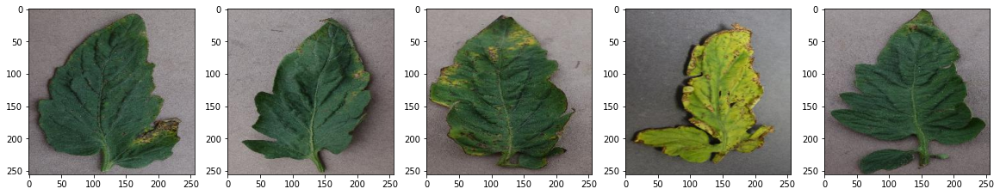

Tomato___Early_blight


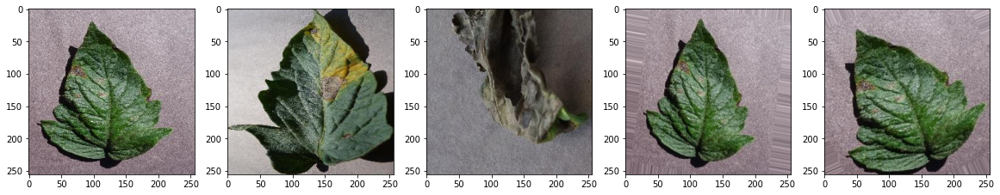

Tomato___healthy


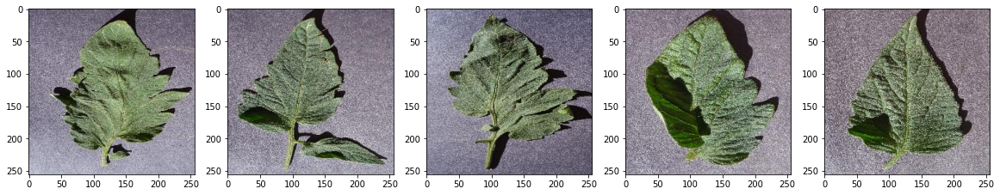

Tomato___Late_blight


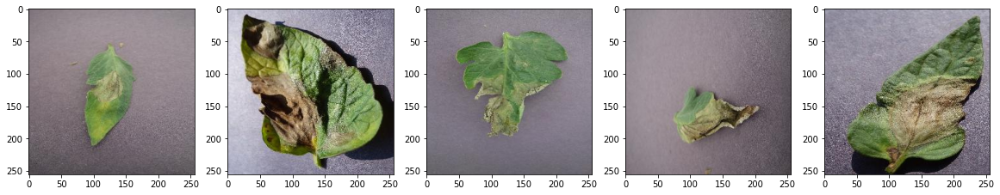

Tomato___Leaf_Mold


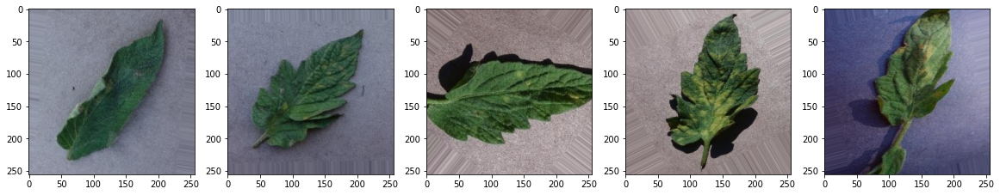

Tomato___Septoria_leaf_spot


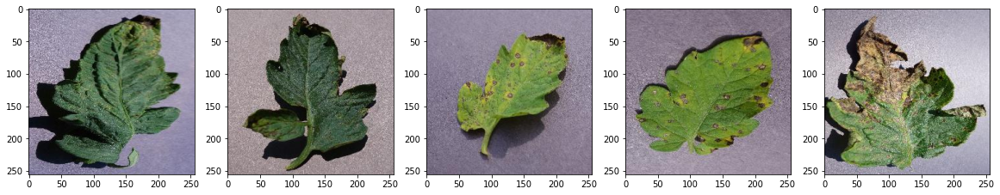

Tomato___Spider_mites Two-spotted_spider_mite


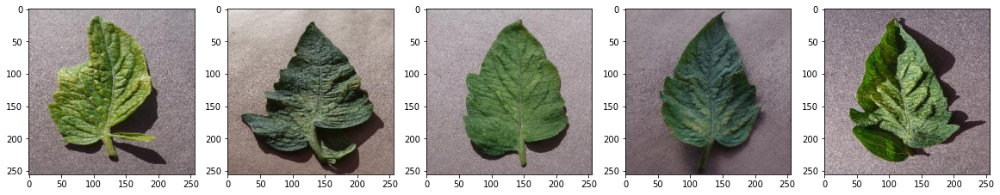

Tomato___Target_Spot


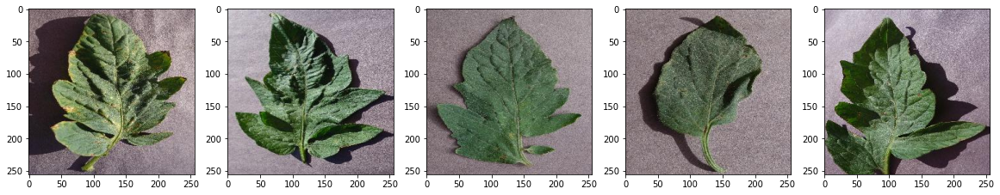

Tomato___Tomato_mosaic_virus


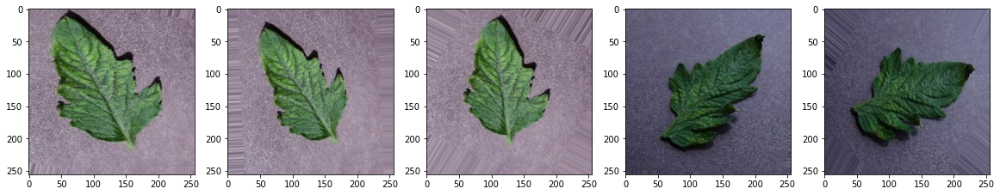

Tomato___Tomato_Yellow_Leaf_Curl_Virus


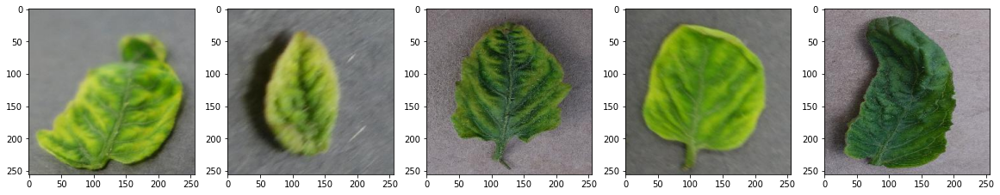

In [9]:
#checking image on directory
for  images in list_val_dir:
  print(images)
  class_dir = os.path.join(image_directory,images)
  class_images = os.listdir(class_dir)
  plt.figure(figsize=(20, 4))
  for i, img_path in enumerate(class_images[:5]):
    sp = plt.subplot(1, 5, i+1)
    img = mpimg.imread(os.path.join(class_dir, img_path))
    plt.imshow(img)
  plt.show()

In [10]:
root_dir = './Tomato_Leaf_Deseases/Split_dtVal'


# Empty directory to prevent FileExistsError is the function is run several times
if os.path.exists(root_dir):
  shutil.rmtree(root_dir)

#create training and testing directory
def create_train_and_test_dir(root_path):
    
    train='validation'
    tes='testing'
  #CREATE SUB OF ROOT DIRECTORY
    path_train=os.path.join(root_dir,train)
    path_test=os.path.join(root_dir,tes)
    os.makedirs(path_train)
    os.makedirs(path_test)
    base_train=root_path+'/validation/'
    base_test=root_path+'/testing/' 
    for i in list_val_dir:
        path_training=os.path.join(base_train,i)
        path_test=os.path.join(base_test,i)
        os.makedirs(path_training)
        os.makedirs(path_test)
        
try:
  create_train_and_test_dir(root_path=root_dir)
except FileExistsError:
  print("You should not be seeing this since the upper directory is removed beforehand")
        
        

In [11]:
#checking folder in test and train directory
for rootdir, dirs, files in os.walk(root_dir):
    for subdir in dirs:
        print(os.path.join(rootdir, subdir))

./Tomato_Leaf_Deseases/Split_dtVal\testing
./Tomato_Leaf_Deseases/Split_dtVal\validation
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Bacterial_spot
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Early_blight
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___healthy
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Late_blight
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Leaf_Mold
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Septoria_leaf_spot
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Spider_mites Two-spotted_spider_mite
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Target_Spot
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Tomato_mosaic_virus
./Tomato_Leaf_Deseases/Split_dtVal\testing\Tomato___Tomato_Yellow_Leaf_Curl_Virus
./Tomato_Leaf_Deseases/Split_dtVal\validation\Tomato___Bacterial_spot
./Tomato_Leaf_Deseases/Split_dtVal\validation\Tomato___Early_blight
./Tomato_Leaf_Deseases/Split_dtVal\validation\Tomato___healthy
./Tomato_Leaf_

In [12]:
#splitting and copyng data for testing and training
def data_split(source_data,training_data,testing_data,split_size):
    files=[]
    for filename in os.listdir(source_data):
        file= source_data + filename
        if os.path.getsize(file)>0:
          files.append(filename)
        else:
          print(filename + ' is zero length, so ignoring.')

    training_length=int(len(files)*split_size)
     
    testing_length = int(len(files) - training_length)
    shuffled_set = random.sample(files, len(files))
    training_set = shuffled_set[0:training_length]
    testing_set = shuffled_set[:testing_length]
    for filename in training_set:
        this_file = source_data + filename
        destination = training_data + filename
        copyfile(this_file, destination)

    for filename in testing_set:
        this_file = source_data + filename
        destination = testing_data + filename
        copyfile(this_file, destination)

In [14]:
 # folder source image 


image_source='./Tomato_Leaf_Deseases/Validation Set/'
#train_directory 
train_directory='./Tomato_Leaf_Deseases/Split_dtVal/validation/'
testing_directgory='./Tomato_Leaf_Deseases/Split_dtVal/testing/'



#Train Data
for dr in list_val_dir:
  # print(dr)
  direc = train_directory+dr+'/'
  # print(direc)
  if len(os.listdir(direc)) > 0:
    for file in os.scandir(direc):
      os.remove(file.path)

#Test Data
for dr in list_val_dir:
  direc2 = testing_directgory+dr+'/'
  if len(os.listdir(direc2)) > 0:
    for file in os.scandir(direc2):
      os.remove(file.path)      


data_split_size=.5

for dat in list_val_dir:
  test_dir=testing_directgory+dat+'/'
  train_dir=train_directory+dat+'/'
  image_src=image_source+dat+'/'
  data_split(image_src,train_dir,test_dir,data_split_size)

Split Train Data

In [8]:
#looking for image properties on training directory
training_directory='./Tomato_Leaf_Deseases/Training Set/'
listdir_train_image=os.listdir(training_directory)
total_train_images=0
for item in listdir_train_image:
    class_dir = os.path.join(training_directory,item)
    sum_total=len(os.listdir(class_dir))
    total_train_images=total_train_images+sum_total
    print("Train",item ," : ",len(os.listdir(class_dir)),"images")
print('total train image: ',total_train_images,"Images")



Train Tomato___Bacterial_spot  :  1000 images
Train Tomato___Early_blight  :  1000 images
Train Tomato___healthy  :  1000 images
Train Tomato___Late_blight  :  1000 images
Train Tomato___Leaf_Mold  :  1000 images
Train Tomato___Septoria_leaf_spot  :  1000 images
Train Tomato___Spider_mites Two-spotted_spider_mite  :  1000 images
Train Tomato___Target_Spot  :  1000 images
Train Tomato___Tomato_mosaic_virus  :  1000 images
Train Tomato___Tomato_Yellow_Leaf_Curl_Virus  :  1000 images
total train image:  10000 Images


In [9]:

#looking for image properties on validation directory
validation_directory='./Tomato_Leaf_Deseases/Split_dtVal/validation/'
listdir_train_image=os.listdir(validation_directory)
total_train_images=0
for item in listdir_train_image:
    class_dir = os.path.join(validation_directory,item)
    sum_total=len(os.listdir(class_dir))
    total_train_images=total_train_images+sum_total
    print("Train",item ," : ",len(os.listdir(class_dir)),"images")
print('total train image: ',total_train_images,"Images")

    
    



Train Tomato___Bacterial_spot  :  350 images
Train Tomato___Early_blight  :  350 images
Train Tomato___healthy  :  350 images
Train Tomato___Late_blight  :  350 images
Train Tomato___Leaf_Mold  :  350 images
Train Tomato___Septoria_leaf_spot  :  350 images
Train Tomato___Spider_mites Two-spotted_spider_mite  :  350 images
Train Tomato___Target_Spot  :  350 images
Train Tomato___Tomato_mosaic_virus  :  350 images
Train Tomato___Tomato_Yellow_Leaf_Curl_Virus  :  350 images
total train image:  3500 Images


In [10]:

#looking for image properties on testing directory
testing_directory='./Tomato_Leaf_Deseases/Split_dtVal/testing/'
listdir_test_images=os.listdir(testing_directory)
total_test_images=0
for item in listdir_test_images:
    class_dir=os.path.join(testing_directory,item)
    sum_total=len(os.listdir(class_dir))
    total_test_images=total_test_images+sum_total
    print("Test",item," : ",len(os.listdir(class_dir)),"images")
print('total test image: ',total_test_images,"Images")

    



Test Tomato___Bacterial_spot  :  350 images
Test Tomato___Early_blight  :  350 images
Test Tomato___healthy  :  350 images
Test Tomato___Late_blight  :  350 images
Test Tomato___Leaf_Mold  :  350 images
Test Tomato___Septoria_leaf_spot  :  350 images
Test Tomato___Spider_mites Two-spotted_spider_mite  :  350 images
Test Tomato___Target_Spot  :  350 images
Test Tomato___Tomato_mosaic_virus  :  350 images
Test Tomato___Tomato_Yellow_Leaf_Curl_Virus  :  350 images
total test image:  3500 Images


Cek Image

In [55]:
# from pathlib import Path
# import imghdr

# data_dir = "./vegetables_data/testing"
# image_extensions = [".png", ".jpg"]  # add there all your images file extensions

# img_type_accepted_by_tf = ["bmp", "gif", "jpeg", "png"]
# for filepath in Path(data_dir).rglob("*"):
#     if filepath.suffix.lower() in image_extensions:
#         img_type = imghdr.what(filepath)
#         if img_type is None:
#             print(f"{filepath} is not an image")
#         elif img_type not in img_type_accepted_by_tf:
#             print(f"{filepath} is a {img_type}, not accepted by TensorFlow")

vegetables_data\testing\kates\55kates.jpg is not an image
vegetables_data\testing\kates\96kates.jpg is not an image
vegetables_data\testing\Peterseli\110Peterseli.jpg is not an image
vegetables_data\testing\Peterseli\32Peterseli.jpg is not an image
vegetables_data\testing\Peterseli\37Peterseli.jpg is not an image
vegetables_data\testing\Peterseli\41Peterseli.jpg is not an image
vegetables_data\testing\sawi\42sawi.jpg is not an image
vegetables_data\testing\selada\34selada.jpg is a webp, not accepted by TensorFlow
vegetables_data\testing\selada\54selada.jpg is not an image


Library for Model

In [11]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, Activation, Flatten, MaxPool2D
from tensorflow.keras.layers.experimental import preprocessing



Build Model

In [34]:
def train_val_generators(TRAINING_DIR, VALIDATION_DIR):
  ### START CODE HERE

  # Instantiate the ImageDataGenerator class (don't forget to set the arguments to augment the images)
  train_datagen = ImageDataGenerator(rescale=1.0/255.,
                                     rotation_range=40,
                                     width_shift_range=0.2,
                                     height_shift_range=0.2,
                                     shear_range=0.2,
                                     zoom_range=0.2,
                                     horizontal_flip=True,
                                     fill_mode='nearest')

  # Pass in the appropriate arguments to the flow_from_directory method
  train_generator = train_datagen.flow_from_directory(directory=TRAINING_DIR,
                                                      batch_size=100,
                                                      class_mode = 'categorical',                                                     
                                                      target_size=(150, 150))

  # Instantiate the ImageDataGenerator class (don't forget to set the rescale argument)
  validation_datagen = ImageDataGenerator(rescale=1.0/255.)

  # Pass in the appropriate arguments to the flow_from_directory method
  validation_generator = validation_datagen.flow_from_directory(directory=VALIDATION_DIR,
                                                                batch_size=100,
                                                                class_mode = 'categorical',
                                                                shuffle=False,
                                                                target_size=(150, 150))
  ### END CODE HERE
  return train_generator, validation_generator

In [35]:
# Test your generators
# training_direct='./dt_vegetables/train/'
# testing_direct='./dt_vegetables/validation/'

train_generator, validation_generator = train_val_generators(training_directory, validation_directory)


Found 10000 images belonging to 10 classes.
Found 3500 images belonging to 10 classes.


In [14]:
labels = []
for label in train_generator.class_indices:
  labels.append(label)
num_labels = len(labels)

print("Labels: {}".format(labels))

Labels: ['Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot', 'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Tomato_mosaic_virus', 'Tomato___healthy']


In [29]:
def create_model():
  # DEFINE A KERAS MODEL TO CLASSIFY CATS V DOGS
  # USE AT LEAST 3 CONVOLUTION LAYERS

  ### START CODE HERE

  model = tf.keras.models.Sequential([ 
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),  
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'), 
    tf.keras.layers.MaxPooling2D(2,2),  
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(num_labels, activation='softmax') 
  ])

  
  model.compile(optimizer=tf.keras.optimizers.RMSprop(lr=0.001),
                loss='binary_crossentropy',
                metrics=['accuracy']) 
    
  ### END CODE HERE

  return model

In [30]:
# Get the untrained model
model = create_model() #Salah manggil tapi bagus hasilnya
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 17, 17, 128)     

C:\Users\bryli\AppData\Roaming\Python\Python37\site-packages\keras\optimizer_v2\rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [31]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.97):
      self.model.stop_training = True
      print("\nThe accuracy of the training set has reached > 99%!")
callbacks = myCallback()

In [32]:
# Train the model
# Note that this may take some time.
history = model.fit(train_generator,
                    epochs=15,
                    verbose=1,
                    validation_data=validation_generator,
                    callbacks=[callbacks])

Epoch 1/15
100/100 [==============================] - 400s 4s/step - loss: 0.3625 - accuracy: 0.1877 - val_loss: 0.2791 - val_accuracy: 0.3074
Epoch 2/15
100/100 [==============================] - 195s 2s/step - loss: 0.2657 - accuracy: 0.3993 - val_loss: 0.1780 - val_accuracy: 0.6243
Epoch 3/15
100/100 [==============================] - 192s 2s/step - loss: 0.2084 - accuracy: 0.5497 - val_loss: 0.1349 - val_accuracy: 0.7217
Epoch 4/15
100/100 [==============================] - 198s 2s/step - loss: 0.1779 - accuracy: 0.6147 - val_loss: 0.1830 - val_accuracy: 0.6169
Epoch 5/15
100/100 [==============================] - 195s 2s/step - loss: 0.1484 - accuracy: 0.6939 - val_loss: 0.1510 - val_accuracy: 0.7154
Epoch 6/15
100/100 [==============================] - 195s 2s/step - loss: 0.1399 - accuracy: 0.7141 - val_loss: 0.0904 - val_accuracy: 0.8180
Epoch 7/15
100/100 [==============================] - 191s 2s/step - loss: 0.1240 - accuracy: 0.7587 - val_loss: 0.1950 - val_accuracy: 0.6631

In [37]:
export_dir = './SaveModel1'
tf.saved_model.save(model, export_dir)

INFO:tensorflow:Assets written to: ./SaveModel1\assets


In [38]:
# Convert the model.
converte = tf.lite.TFLiteConverter.from_saved_model(export_dir)
tflite_mode = converte.convert()

In [39]:
import pathlib
tflite_model_file = pathlib.Path('model.tflite')
tflite_model_file.write_bytes(tflite_mode)

76674304

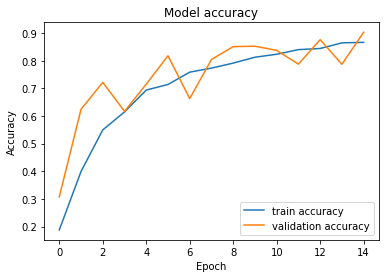

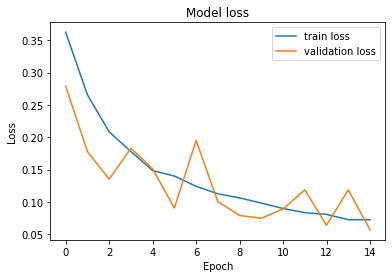

In [33]:
def plot_accuracy(history):
    
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()
    
def plot_loss(history):
    
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()
    
plot_accuracy(history)
plot_loss(history)

In [26]:
# Library Evaluation 
import shutil
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [35]:
y_test = validation_generator.classes
y_pred = model.predict_generator(validation_generator)
y_pred = tf.argmax(y_pred, axis=1)

C:\Users\bryli\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


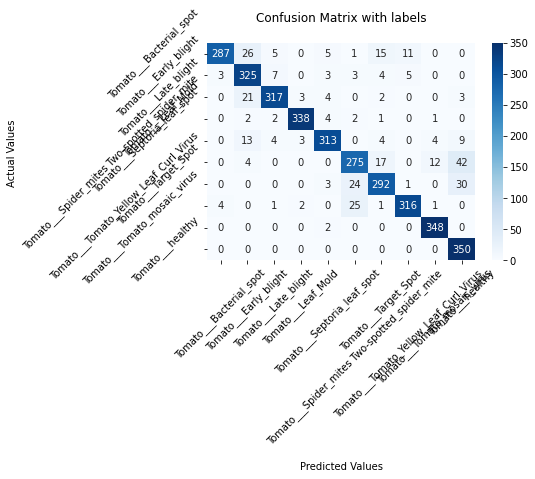

In [36]:
#Generate the confusion matrix
cf_matrix = confusion_matrix(y_test, y_pred)

ax = sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues')

ax.set_title('Confusion Matrix with labels\n');
ax.set_xlabel('\nPredicted Values')
ax.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax.xaxis.set_ticklabels(labels, rotation=45)
ax.yaxis.set_ticklabels(labels, rotation=45)

## Display the visualization of the Confusion Matrix.
plt.show()

Model 2

In [21]:
def create_model2():
  # DEFINE A KERAS MODEL TO CLASSIFY CATS V DOGS
  # USE AT LEAST 3 CONVOLUTION LAYERS

  ### START CODE HERE

  model2 = tf.keras.models.Sequential([ 
    tf.keras.layers.Conv2D(32, (3,3), activation='relu', input_shape=(150, 150, 3)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64, (3,3), activation='relu'),
    tf.keras.layers.MaxPooling2D(2,2),  
    tf.keras.layers.Conv2D(128, (3,3), activation='relu'), 
    tf.keras.layers.MaxPooling2D(2,2),  
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(num_labels, activation='softmax') 
  ])

  
  model2.compile(optimizer=tf.keras.optimizers.RMSprop(lr=0.001),
                loss='binary_crossentropy',
                metrics=['accuracy']) 
    
  ### END CODE HERE

  return model2

In [22]:
# Get the untrained model
model2 = create_model2() #Salah manggil tapi bagus hasilnya
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_5 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPooling  (None, 17, 17, 128)     

C:\Users\bryli\AppData\Roaming\Python\Python37\site-packages\keras\optimizer_v2\rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [23]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.97):
      self.model.stop_training = True
      print("\nThe accuracy of the training set has reached > 99%!")
callbacks = myCallback()

In [24]:
# Train the model
# Note that this may take some time.
history2 = model2.fit(train_generator,
                    epochs=20,
                    verbose=1,
                    validation_data=validation_generator,
                    callbacks=[callbacks])

Epoch 1/20
100/100 [==============================] - 169s 2s/step - loss: 0.4224 - accuracy: 0.1311 - val_loss: 0.2941 - val_accuracy: 0.2620
Epoch 2/20
100/100 [==============================] - 170s 2s/step - loss: 0.2983 - accuracy: 0.2876 - val_loss: 0.2693 - val_accuracy: 0.3820
Epoch 3/20
100/100 [==============================] - 170s 2s/step - loss: 0.2443 - accuracy: 0.4505 - val_loss: 0.1607 - val_accuracy: 0.6617
Epoch 4/20
100/100 [==============================] - 169s 2s/step - loss: 0.2034 - accuracy: 0.5580 - val_loss: 0.2437 - val_accuracy: 0.4926
Epoch 5/20
100/100 [==============================] - 170s 2s/step - loss: 0.1773 - accuracy: 0.6249 - val_loss: 0.1811 - val_accuracy: 0.6226
Epoch 6/20
100/100 [==============================] - 171s 2s/step - loss: 0.1533 - accuracy: 0.6793 - val_loss: 0.2076 - val_accuracy: 0.5997
Epoch 7/20
100/100 [==============================] - 169s 2s/step - loss: 0.1422 - accuracy: 0.7096 - val_loss: 0.2880 - val_accuracy: 0.5031

In [49]:
export_dir2 = './SaveModel2'
tf.saved_model.save(model2, export_dir2)

INFO:tensorflow:Assets written to: ./SaveModel2\assets


INFO:tensorflow:Assets written to: ./SaveModel2\assets


In [50]:
# Convert the model.
converte2 = tf.lite.TFLiteConverter.from_saved_model(export_dir2)
tflite_mode2 = converte2.convert()

In [51]:
import pathlib
tflite_model_file3 = pathlib.Path('model2.tflite')
tflite_model_file3.write_bytes(tflite_mode2)

76674304

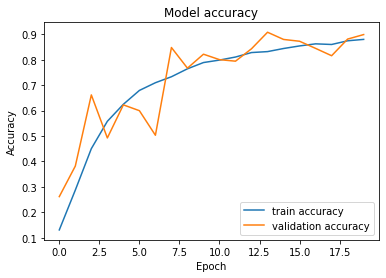

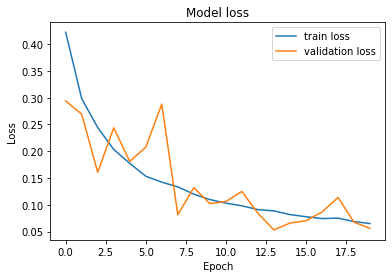

In [25]:
def plot_accuracy(history):
    
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()
    
def plot_loss(history):
    
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()
    
plot_accuracy(history2)
plot_loss(history2)

In [27]:
y_test2 = validation_generator.classes
y_pred2 = model2.predict_generator(validation_generator)
y_pred2 = tf.argmax(y_pred2, axis=1)

C:\Users\bryli\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


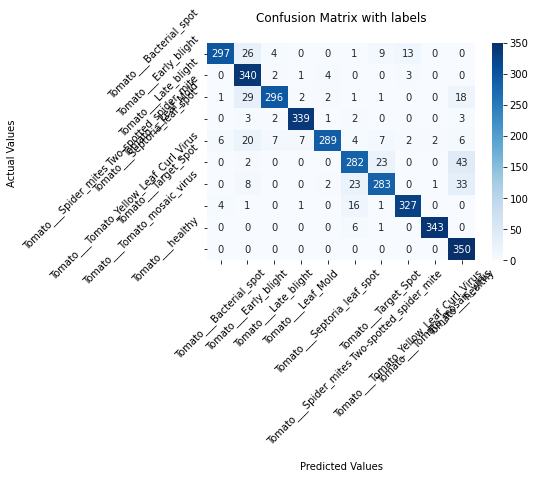

In [28]:
#Generate the confusion matrix
cf_matrix2 = confusion_matrix(y_test2, y_pred2)

ax2 = sns.heatmap(cf_matrix2, annot=True, fmt='g', cmap='Blues')

ax2.set_title('Confusion Matrix with labels\n');
ax2.set_xlabel('\nPredicted Values')
ax2.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax2.xaxis.set_ticklabels(labels, rotation=45)
ax2.yaxis.set_ticklabels(labels, rotation=45)

## Display the visualization of the Confusion Matrix.
plt.show()

In [29]:
print(train_generator.class_indices)
print()
print(classification_report(y_test2, y_pred2))

{'Tomato___Bacterial_spot': 0, 'Tomato___Early_blight': 1, 'Tomato___Late_blight': 2, 'Tomato___Leaf_Mold': 3, 'Tomato___Septoria_leaf_spot': 4, 'Tomato___Spider_mites Two-spotted_spider_mite': 5, 'Tomato___Target_Spot': 6, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 7, 'Tomato___Tomato_mosaic_virus': 8, 'Tomato___healthy': 9}

              precision    recall  f1-score   support

           0       0.96      0.85      0.90       350
           1       0.79      0.97      0.87       350
           2       0.95      0.85      0.90       350
           3       0.97      0.97      0.97       350
           4       0.97      0.83      0.89       350
           5       0.84      0.81      0.82       350
           6       0.87      0.81      0.84       350
           7       0.95      0.93      0.94       350
           8       0.99      0.98      0.99       350
           9       0.77      1.00      0.87       350

    accuracy                           0.90      3500
   macro avg       0.9

[[1.3276107e-12 1.4662631e-09 8.9302938e-07 9.9999690e-01 2.1700314e-06
  7.7141089e-12 1.6871515e-11 1.9290958e-12 8.8072032e-12 6.1431877e-09]]
Tomato___Leaf_Mold


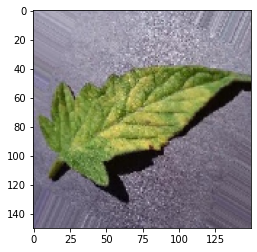

In [54]:
# Mencoba prediksi
# from google.colab import files
from keras.preprocessing import image
 
uploaded = './Tomato_Leaf_Deseases/Split_dtVal/testing/Tomato___Leaf_Mold/image (1129).jpg'
 
img = image.load_img(uploaded, target_size=(150,150))
imgplot = plt.imshow(img)
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
images = np.vstack([x])
images /= 255 # because on train and test image is normalized, on image predict supposed to be too.
classes = model2.predict(images, batch_size=100) # the value is not always 1 and 0 because of probabilities
predicted_class_indices=np.argmax(classes) # use to check prediction that have higher probabilities
print(classes)

if predicted_class_indices == 0:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 1:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 2:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 3:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 4:
  print(labels[predicted_class_indices])
# elif predicted_class_indices == 4:
#   print('kangkung')
elif predicted_class_indices == 5:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 6:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 7:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 8:
  print(labels[predicted_class_indices])
elif predicted_class_indices ==  9:
  print(labels[predicted_class_indices])

else:
  print('???')

New

In [36]:
from tensorflow.keras.applications.densenet import DenseNet121

def create_model3():
  # DEFINE A KERAS MODEL TO CLASSIFY CATS V DOGS
  # USE AT LEAST 3 CONVOLUTION LAYERS

  ### START CODE HERE

  model3 = tf.keras.models.Sequential([ 
    DenseNet121(
        include_top=False,
        weights='imagenet',
        input_shape=(150, 150, 3)),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(256, activation='relu'),
    tf.keras.layers.Dense(num_labels, activation='softmax')
  ])

  
  model3.compile(optimizer=tf.keras.optimizers.SGD(lr=0.002, momentum=0.9),
                loss='categorical_crossentropy',
                metrics=['accuracy']) 
    
  ### END CODE HERE

  return model3

In [37]:
# Get the untrained model
model3 = create_model3()
model3.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 4, 4, 1024)        7037504   
                                                                 
 global_average_pooling2d_1   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_8 (Dense)             (None, 256)               262400    
                                                                 
 dense_9 (Dense)             (None, 10)                2570      
                                                                 
Total params: 7,302,474
Trainable params: 7,218,826
Non-trainable params: 83,648
_______________________________________

C:\Users\bryli\AppData\Roaming\Python\Python37\site-packages\keras\optimizer_v2\gradient_descent.py:102: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(SGD, self).__init__(name, **kwargs)


In [38]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('accuracy')>0.97):
      self.model.stop_training = True
      print("\nThe accuracy of the training set has reached > 99%!")
callbacks = myCallback()

In [39]:
# Train the model
# Note that this may take some time.
history3 = model3.fit(train_generator,
                    epochs=10,
                    verbose=1,
                    validation_data=validation_generator,
                    callbacks=[callbacks])

Epoch 1/10
100/100 [==============================] - 1604s 16s/step - loss: 1.0317 - accuracy: 0.6687 - val_loss: 0.8275 - val_accuracy: 0.7094
Epoch 2/10
100/100 [==============================] - 1558s 16s/step - loss: 0.2330 - accuracy: 0.9212 - val_loss: 1.4892 - val_accuracy: 0.6154
Epoch 3/10
100/100 [==============================] - 1542s 15s/step - loss: 0.1388 - accuracy: 0.9534 - val_loss: 0.8623 - val_accuracy: 0.8000
Epoch 4/10
100/100 [==============================] - 1590s 16s/step - loss: 0.0992 - accuracy: 0.9698 - val_loss: 0.3435 - val_accuracy: 0.8960
Epoch 5/10
100/100 [==============================] - ETA: 0s - loss: 0.0857 - accuracy: 0.9723 
The accuracy of the training set has reached > 99%!
100/100 [==============================] - 1492s 15s/step - loss: 0.0857 - accuracy: 0.9723 - val_loss: 0.1722 - val_accuracy: 0.9426


In [46]:
export_dir3 = './SaveModel3'
tf.saved_model.save(model3, export_dir3)

INFO:tensorflow:Assets written to: ./SaveModel3\assets


In [47]:
# Convert the model.
converte3 = tf.lite.TFLiteConverter.from_saved_model(export_dir3)
tflite_mode3 = converte3.convert()

In [48]:
import pathlib
tflite_model_file3 = pathlib.Path('model3.tflite')
tflite_model_file3.write_bytes(tflite_mode3)

28961136

In [ ]:
# Convert the model.
converte3 = tf.lite.TFLiteConverter.from_saved_model(export_dir3)
tflite_mode3 = converte3.convert()

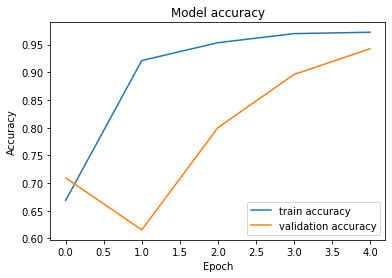

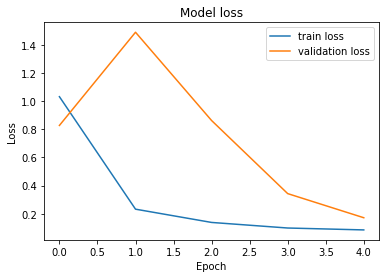

In [40]:
def plot_accuracy(history):
    
    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Accuracy_v1_InceptionV3')
    plt.show()
    
def plot_loss(history):
    
    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('Loss_v1_InceptionV3')
    plt.show()
    
plot_accuracy(history3)
plot_loss(history3)

In [42]:
y_test3 = validation_generator.classes
y_pred3 = model3.predict_generator(validation_generator)
y_pred3 = tf.argmax(y_pred3, axis=1)

C:\Users\bryli\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:2: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  


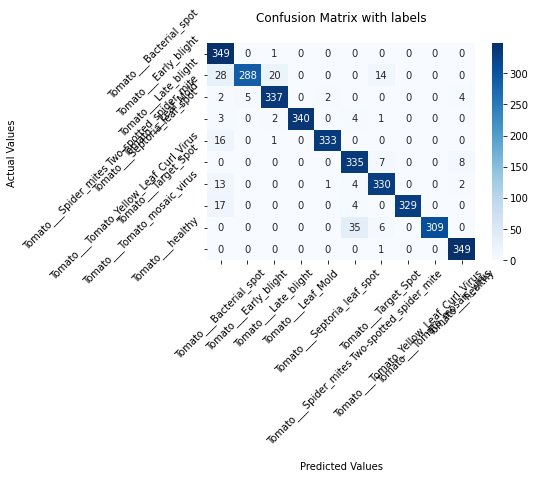

In [44]:
#Generate the confusion matrix
cf_matrix3 = confusion_matrix(y_test3, y_pred3)

ax3 = sns.heatmap(cf_matrix3, annot=True, fmt='g', cmap='Blues')

ax3.set_title('Confusion Matrix with labels\n');
ax3.set_xlabel('\nPredicted Values')
ax3.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
ax3.xaxis.set_ticklabels(labels, rotation=45)
ax3.yaxis.set_ticklabels(labels, rotation=45)

## Display the visualization of the Confusion Matrix.
plt.show()

In [45]:
print(train_generator.class_indices)
print()
print(classification_report(y_test3, y_pred3))

{'Tomato___Bacterial_spot': 0, 'Tomato___Early_blight': 1, 'Tomato___Late_blight': 2, 'Tomato___Leaf_Mold': 3, 'Tomato___Septoria_leaf_spot': 4, 'Tomato___Spider_mites Two-spotted_spider_mite': 5, 'Tomato___Target_Spot': 6, 'Tomato___Tomato_Yellow_Leaf_Curl_Virus': 7, 'Tomato___Tomato_mosaic_virus': 8, 'Tomato___healthy': 9}

              precision    recall  f1-score   support

           0       0.82      1.00      0.90       350
           1       0.98      0.82      0.90       350
           2       0.93      0.96      0.95       350
           3       1.00      0.97      0.99       350
           4       0.99      0.95      0.97       350
           5       0.88      0.96      0.92       350
           6       0.92      0.94      0.93       350
           7       1.00      0.94      0.97       350
           8       1.00      0.88      0.94       350
           9       0.96      1.00      0.98       350

    accuracy                           0.94      3500
   macro avg       0.9

[[9.9998569e-01 3.2885594e-06 8.6018053e-07 1.8361028e-07 8.6955589e-07
  9.8652016e-08 2.6063467e-06 6.3312214e-06 6.3817684e-09 1.5904169e-07]]
Tomato___Bacterial_spot


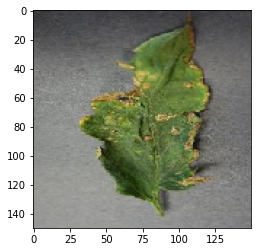

In [52]:
# Mencoba prediksi
# from google.colab import files
from keras.preprocessing import image
 
uploaded = './Tomato_Leaf_Deseases/Split_dtVal/testing/Tomato___Bacterial_spot/image (1095).jpg'
 
img = image.load_img(uploaded, target_size=(150,150))
imgplot = plt.imshow(img)
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
images = np.vstack([x])
images /= 255 # because on train and test image is normalized, on image predict supposed to be too.
classes = model3.predict(images, batch_size=100) # the value is not always 1 and 0 because of probabilities
predicted_class_indices=np.argmax(classes) # use to check prediction that have higher probabilities
print(classes)

if predicted_class_indices == 0:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 1:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 2:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 3:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 4:
  print(labels[predicted_class_indices])
# elif predicted_class_indices == 4:
#   print('kangkung')
elif predicted_class_indices == 5:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 6:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 7:
  print(labels[predicted_class_indices])
elif predicted_class_indices == 8:
  print(labels[predicted_class_indices])
elif predicted_class_indices ==  9:
  print(labels[predicted_class_indices])

else:
  print('???')